In [10]:
import os
import glob
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix
import pynapple as nap
from spatial_manifolds.toroidal import *
from spatial_manifolds.behaviour_plots import *
from spatial_manifolds.data.binning import get_bin_config
from spatial_manifolds.mlencoding import *
from spatial_manifolds.circular_decoder import circular_decoder, cross_validate_decoder, cross_validate_decoder_time, circular_nanmean
from spatial_manifolds.data.curation import curate_clusters
from scipy.stats import zscore
from spatial_manifolds.util import gaussian_filter_nan
from spatial_manifolds.predictive_grid import compute_travel_projected, wrap_list
from spatial_manifolds.behaviour_plots import *
from spatial_manifolds.detect_grids import *
from spatial_manifolds.brainrender_helper import *

import warnings
warnings.filterwarnings('ignore')
%load_ext autoreload
%autoreload 2
%matplotlib inline

fig_path = '/Users/harryclark/Documents/figs/FIGURE1/'
source_path = '/Users/harryclark/Downloads/COHORT12/'
locations = pd.read_csv('/Users/harryclark/Downloads/all_cluster_brain_locations_chris.csv')
locations['coord_SCs_x'] = locations['coord_SCs_x'] * -1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
import numpy as np

def make_annotations(mouse, path=None):
    Mouse = f'M{mouse}'

    data_paths = [f"/Users/harryclark/Documents/brainrender/probe_data/{Mouse}_probe_locations_{a}.mat" for a in [1,2,3,4]]
    shank_offsets_SC = pd.read_csv('/Users/harryclark/Documents/brainrender/probe_data/shank_offsets.csv')
    clusters_df = pd.read_csv(f'/Users/harryclark/Documents/brainrender/probe_data/extremum_channel_locations_kilosort4_0.csv')
    clusters_df = clusters_df[clusters_df['mouse'] == mouse]
    shank_offsets_SC = shank_offsets_SC[shank_offsets_SC['mouse'] == mouse]
    clusters_df = reconstruct_shank_id(clusters_df, mouse)
    probes_locs = [read_probe_mat(data_path) for data_path in data_paths]
    adjusted_probes_locs_CCF = np.array([adjust_probe_locs(probe_locs) for probe_locs in probes_locs])
    adjusted_probe_locs_SC, adjusted_probe_locs_CCF = correct_for_left_side(adjusted_probes_locs_CCF)
    adjusted_probe_locs_SC, adjusted_probe_locs_CCF = adjust_to_shank_offsets(adjusted_probe_locs_SC, shank_offsets_SC)
    
    ymin = -300; ymax = 3000
    xmin = -200; xmax = 1000
    xs = np.arange(xmin, xmax, 1)
    ys = np.arange(ymin, ymax, 1)

    if os.path.exists(f"{path}/M{mouse}_annotations.npy"):
        # Load annotations and colors from disk
        annotations = np.load(f"{path}/M{mouse}_annotations.npy", allow_pickle=True)
        annotation_colors = np.load(f"{path}/M{mouse}_annotation_colors.npy", allow_pickle=True)
        return annotations, annotation_colors, xs, ys
    
    else:
        annotations = np.zeros((len(ys), len(xs)), dtype=object)
        for yi, y in enumerate(ys):
            for xi, x in enumerate(xs):
                coord_SC, coord_CCF  = brain_coord_from_xy(x, y, adjusted_probe_locs_SC, shank_id=0)
                z_CCF, y_CCF, x_CCF = np.round(coord_CCF/10).astype(int)
                annotation_index = annotations_set[z_CCF,y_CCF,x_CCF]
                if len(structure_set[structure_set['id'] == annotation_index]) ==1:
                    annotation = structure_set[structure_set['id'] == annotation_index]['acronym'].iloc[0]
                else:
                    annotation ='root' # out of brain
                annotations[yi,xi] = annotation

        annotation_colors = get_annotation_colors_2D(annotations)

        # Save
        np.save(f"{path}/M{mouse}_annotations.npy", annotations)
        np.save(f"{path}/M{mouse}_annotation_colors.npy", annotation_colors)

    return annotations, annotation_colors, xs, ys

hi


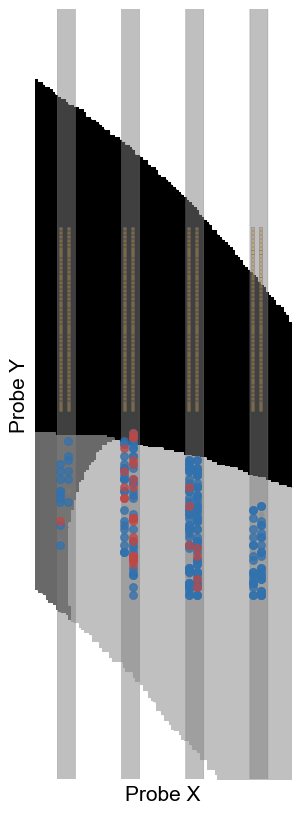

In [37]:
# get all gcs cluster_ids from gcs mouse 26 day 19
gcs, ngs, ns, sc, ngs_ns, all = cell_classification_of1(mouse=26, day=19, percentile_threshold=95, verbose=False) # subset
example_cluster_ids = gcs.cluster_id.values

def plot_cells_on_annotated_probe(mouse, day, gcs, ngs, all_cells, path='/Users/harryclark/Documents/spatial-manifolds/data'):
    """
    Plot GCS and NGS cells on the annotated probe map for a given mouse and day.
    GCS cells are shown in red, NGS cells in blue, all other cells in gray.
    """
    # Load annotations and colors
    annotations, annotation_colors, xs, ys = make_annotations(mouse, path=path)
    unique_colors = np.unique(annotation_colors)
    
    fig, ax = plt.subplots(figsize=(6, 10))
    # Plot annotation background
    for color_ in unique_colors:
        border_points = extract_border(annotation_colors, color_, only_border=False)
        x_points = xs[border_points[:, 1]]
        y_points = ys[border_points[:, 0]]
        ax.scatter(x_points, y_points, color=color_, s=1, rasterized=True)
    plot_NP2_probe(ax, sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa',
                   probe_alpha=0.5, contacts_alpha=0.5, probe_color='grey', probe_edgecolor='black')
    
    # Plot all cells in gray
    ax.scatter(all_cells.probe_x.values, all_cells.probe_y.values, marker='o', color="grey", alpha=0.3, s=10, label='All')
    # Plot NGS cells in blue
    ax.scatter(ngs.probe_x.values, ngs.probe_y.values, marker='o', color='#3171ae', alpha=0.7, s=30, label='NGS')
    # Plot GCS cells in red
    ax.scatter(gcs.probe_x.values, gcs.probe_y.values, marker='o', color='#c04744', alpha=0.7, s=30, label='GCS')
    
    ax.set_ylim([0, 3000])
    ax.set_xlim([-100, 900])
    ax.set_xlabel('Probe X')
    ax.set_ylabel('Probe Y')
    plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_3_xgboost/M{mouse}D{day}_probe_map.pdf')
    plt.show()

# Example usage for the current mouse and day:
plot_cells_on_annotated_probe(26, 19, gcs, ngs, all)


Mouse: 26, Day: 19, Cluster: 113
hi
hi
plotting true rate map
plotting true rate map
for cell 113, avg pR2 (pos only) is 0.03996431934223168, using 0 covariate cells
for cell 113, avg pR2 (pos only) is 0.03996431934223168, using 0 covariate cells
using expected spikes for cell 18
using expected spikes for cell 18
for cell 113, avg pR2 is 0.1220642687427382, for shank0, using 16 covariate cells
for cell 113, avg pR2 is 0.1220642687427382, for shank0, using 16 covariate cells
using expected spikes for cell 18
using expected spikes for cell 18
hi
hi
for cell 113, avg pR2 is 0.2548656630580433, for shank1, using 54 covariate cells
for cell 113, avg pR2 is 0.2548656630580433, for shank1, using 54 covariate cells
using expected spikes for cell 18
using expected spikes for cell 18
hi
hi
for cell 113, avg pR2 is 0.0792711206197464, for shank2, using 104 covariate cells
for cell 113, avg pR2 is 0.0792711206197464, for shank2, using 104 covariate cells
using expected spikes for cell 18
using ex

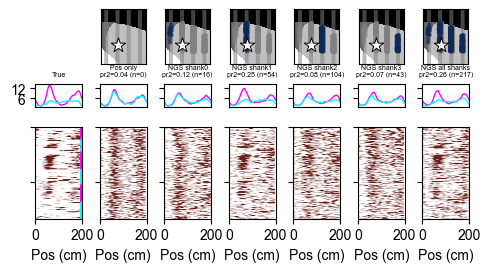

In [ ]:
# For each good example cell, reconstruct firing rate profiles using xgboost predictions

# set up xgboost history model
xgb_history = MLencoding(tunemodel='xgboost', cov_history=True, spike_history=False,
                            window=time_bs, n_filters=5, max_time=1000)

mouse = 26
day = 19
example_cluster_ids = [113]

#example_cluster_ids = [156]

for example_cluster_id in example_cluster_ids:
    print(f"\nMouse: {mouse}, Day: {day}, Cluster: {example_cluster_id}")
    gcs, ngs, ns, sc, ngs_ns, all = cell_classification_of1(mouse, day, percentile_threshold=95, verbose=False) # subset
    tcs, tcs_time, _, last_ephys_bin, beh, clusters = compute_vr_tcs(mouse,day, apply_zscore=False, apply_guassian_filter=False)
    last_ephys_time_bin = clusters[clusters.index[0]].count(bin_size=time_bs, time_units = 'ms').index[-1]

    # time binned variables for later
    ep = nap.IntervalSet(start=0, end=last_ephys_time_bin, time_units = 's')
    speed_in_time = np.array(beh['S'].bin_average(bin_size=time_bs, time_units = 'ms', ep=ep))
    dt_in_time = np.array(beh['travel'].bin_average(bin_size=time_bs, time_units = 'ms', ep=ep)-((beh['trial_number'][0]-1)*tl))
    pos_in_time = dt_in_time%tl
    trial_number_in_time = (dt_in_time//tl)+beh['trial_number'][0]

    if np.any(np.isnan(pos_in_time)):
        series = pd.Series(dt_in_time)
        filled_series = series.ffill().bfill()
        dt_in_time = np.array(filled_series)
        pos_in_time = dt_in_time%tl
        trial_number_in_time = (dt_in_time//tl)+beh['trial_number'][0]

    if np.any(np.isnan(speed_in_time)):
        series = pd.Series(speed_in_time)
        filled_series = series.ffill().bfill()
        speed_in_time = np.array(filled_series)

    # compute the spectrogram and labels from the most adunant grid module
    peak_indices = [12, 28, 44, 60, 76]
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in [example_cluster_id] if cluster_id in tcs}
    tcs_to_use[1000] = tcs_to_use[example_cluster_id]

    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3] 
    fvalid = results[5]
    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels = np.isin(max_peaks, peak_indices).astype(int)

    # compute trial labels for task anchoring to use in the xgboost model mask
    tc = tcs[example_cluster_id] # example grid cell
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin] # only want bins with ephys data in it
    task_anchored_labels = get_kmeans_spatial_labels(tc, labels, bs=bs, tl=tl) # reuse kmeans function to get the labels based on the task anchoring

    # Get the target cell's firing rate
    target_fr = tcs_time[example_cluster_id]

    locations = pd.read_csv(f'{source_path}/all_cluster_brain_locations_chris.csv')
    locations = locations[(locations['mouse'] == mouse) & (locations['day'] == day)]
    locations['coord_SCs_x'] = locations['coord_SCs_x'] * -1  # correct for the flipped SCs x coordinates

    # Assign shank IDs to NGS cells
    ngs = reconstruct_shank_id(ngs, mouse, colname='probe_x')

    # Set up 7-column plot: True, Pos-only, shank0, shank1, shank2, shank3, all-shanks
    fig, ax = plt.subplots(ncols=7, nrows=3, figsize=(rm_figsize[0]*5.6, rm_figsize[1]*1.7), 
                           sharex=False, sharey='row', height_ratios=[0.6, 0.25, 1], width_ratios=[1,1,1,1,1,1,1])
    plt.subplots_adjust(wspace=0.38, hspace=0.35)

    # --- Annotation plot above Pos-only column (no cells highlighted) ---
    annotations, annotation_colors, xs, ys = make_annotations(mouse, path='/Users/harryclark/Documents/spatial-manifolds/data')
    unique_colors = np.unique(annotation_colors)
    for color_ in unique_colors:
        border_points = extract_border(annotation_colors, color_, only_border=False)
        x_points = xs[border_points[:, 1]]
        y_points = ys[border_points[:, 0]]
        ax[0,1].scatter(x_points, y_points, color=color_, s=1, label=color_, rasterized=True)
    plot_NP2_probe(ax[0,1], sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa', 
                probe_alpha=0.5, contacts_alpha=0.0, probe_color='grey', probe_edgecolor='black')
    ax[0,1].set_ylim([0, 3000])
    ax[0,1].set_xlim([-100, 900])
    ax[0,1].spines['top'].set_visible(True)
    ax[0,1].spines['right'].set_visible(True)
    ax[0,1].spines['bottom'].set_visible(True)
    ax[0,1].spines['left'].set_visible(True)

    # --- True rate map ---
    tc = tcs[example_cluster_id]
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin] # only want bins with ephys data in it
    print(f'plotting true rate map')
    plot_firing_rate_map(ax[2,0], tc, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap('#69201a'))
    ax[1,0].set_title('True', fontsize=5)

    # --- TA/TI trial-averaged firing rate maps for True ---
    for i, (label, label_name, color) in enumerate(zip([True, False], ['TA', 'TI'], ["magenta", "cyan"])):
        mask = (task_anchored_labels == label)
        if np.sum(mask) > 5:
            x, y = get_avg_profile(tc, bs, tl, mask=mask)
            ax[1,0].plot(x, y, color=color, linewidth=1)
        ax[2,0].scatter(200*np.ones(len(task_anchored_labels))[mask], np.arange(len(task_anchored_labels))[mask], color=color, s=5)

    # --- Position-only (n=0) reconstruction ---
    X_posonly = pos_in_time.reshape(-1, 1)
    Y_hat_pos, pR2_cv_pos = xgb_history.fit_cv(X_posonly, target_fr, verbose=0, continuous_folds=True)
    print(f'for cell {example_cluster_id}, avg pR2 (pos only) is {np.nanmean(pR2_cv_pos)}, using 0 covariate cells')
    expected_spikes_pos = {ns.cluster_id.values[0]: Y_hat_pos}
    tcs_expected_spikes_pos, _, _ , last_ephys_bin, beh, _ = compute_vr_tcs_using_expected_spikes(
        mouse, day, apply_zscore=False, apply_guassian_filter=False, vr_type='VR', source_path=source_path, expected_spikes=expected_spikes_pos)
    tc_es_pos = tcs_expected_spikes_pos[ns.cluster_id.values[0]]
    tc_es_pos = gaussian_filter(np.nan_to_num(tc_es_pos).astype(np.float64), sigma=2.5)
    tc_es_pos = tc_es_pos[:last_ephys_bin]
    plot_firing_rate_map(ax[2,1], tc_es_pos, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap('#69201a'))
    ax[1,1].set_title(f'Pos only\npr2={np.nanmean(pR2_cv_pos):.2f} (n=0)', fontsize=5)
    # Plot TA/TI averages
    for label, color in zip([True, False], ["magenta", "cyan"]):
        mask = (task_anchored_labels == label)
        if np.sum(mask) > 5:
            x, y = get_avg_profile(tc_es_pos, bs, tl, mask=mask)
            ax[1,1].plot(x, y, color=color, linewidth=1)
    # Show star for target cell in pos only plot
    target_row = all[all['cluster_id'] == example_cluster_id]
    if not target_row.empty:
        x_t, y_t = target_row['probe_x'].values[0], target_row['probe_y'].values[0]
        ax[0,1].scatter(x_t, y_t, marker='*', s=120, color='white', edgecolor='black', linewidth=0.7, zorder=100)
    # Do not remove axis for pos only plot

    # Only allow max two y ticks on 2nd row
    for col in range(7):
        ax[1,col].yaxis.set_major_locator(plt.MaxNLocator(nbins=2, integer=True))

    # --- Shank reconstructions ---
    for shank_idx in range(4):
        shank_label = f'shank{shank_idx}'
        shank_ngs = ngs[ngs['shank_id'] == shank_idx]
        shank_cluster_ids = shank_ngs.cluster_id.values.astype(int)
        cov_tcs_time = {cid: tcs_time[cid] for cid in shank_cluster_ids if cid in tcs_time}
        if len(cov_tcs_time) == 0:
            print(f"No NGS cells found for {shank_label}")
            continue
        X = np.vstack(list(cov_tcs_time.values())).T
        X = np.column_stack((pos_in_time, X))
        n_cov_cells = len(X.T)-1 # subtract 1 for position
        Y_hat, pR2_cv = xgb_history.fit_cv(X, target_fr, verbose=0, continuous_folds=True)
        print(f'for cell {example_cluster_id}, avg pR2 is {np.nanmean(pR2_cv)}, for {shank_label}, using {n_cov_cells} covariate cells')
        expected_spikes = {ns.cluster_id.values[0]: Y_hat}
        tcs_expected_spikes, _, _ , last_ephys_bin, beh, _ = compute_vr_tcs_using_expected_spikes(
            mouse, day, apply_zscore=False, apply_guassian_filter=False, vr_type='VR', source_path=source_path, expected_spikes=expected_spikes)
        tc_es = tcs_expected_spikes[ns.cluster_id.values[0]]
        tc_es = gaussian_filter(np.nan_to_num(tc_es).astype(np.float64), sigma=2.5)
        tc_es = tc_es[:last_ephys_bin]
        plot_firing_rate_map(ax[2,shank_idx+2], tc_es, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap('#69201a'))
        ax[1,shank_idx+2].set_title(f'NGS {shank_label}\npr2={np.nanmean(pR2_cv):.2f} (n={n_cov_cells})', fontsize=5)
        # Plot TA/TI averages
        for label, color in zip([True, False], ["magenta", "cyan"]):
            mask = (task_anchored_labels == label)
            if np.sum(mask) > 5:
                x, y = get_avg_profile(tc_es, bs, tl, mask=mask)
                ax[1,shank_idx+2].plot(x, y, color=color, linewidth=1)
        # No legend

        # Plot probe locations and cell highlights for each shank column
        annotations, annotation_colors, xs, ys = make_annotations(mouse, path='/Users/harryclark/Documents/spatial-manifolds/data')
        unique_colors = np.unique(annotation_colors)
        for color_ in unique_colors:
            border_points = extract_border(annotation_colors, color_, only_border=False)
            x_points = xs[border_points[:, 1]]
            y_points = ys[border_points[:, 0]]
            ax[0,shank_idx+2].scatter(x_points, y_points, color=color_, s=1, label=color_, rasterized=True)
        plot_NP2_probe(ax[0,shank_idx+2], sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa', 
                    probe_alpha=0.5, contacts_alpha=0.0, probe_color='grey', probe_edgecolor='black')
        ax[0,shank_idx+2].scatter(ngs.probe_x.values, ngs.probe_y.values, marker='o', color="grey", alpha=0.4, s=7)
        ax[0,shank_idx+2].scatter(gcs.probe_x.values, gcs.probe_y.values, marker='o', color="grey", alpha=0.4, s=7)
        min_y = min(all['probe_y'].values) - 300
        max_y = max(all['probe_y'].values) + 300
        target_id = example_cluster_id
        target_row = all[all['cluster_id'] == target_id]
        # Move star scatter after all other scatter points for highest zorder
        if not target_row.empty:
            x_t, y_t = target_row['probe_x'].values[0], target_row['probe_y'].values[0]
            ax[0,shank_idx+2].scatter(x_t, y_t, marker='*', s=120, color='white', edgecolor='black', linewidth=0.7, zorder=100)
        cov_row = all[np.isin(all['cluster_id'], shank_cluster_ids)]
        if not cov_row.empty:
            for _, row in cov_row.iterrows():
                x_c, y_c = row['probe_x'], row['probe_y']
                from matplotlib.patches import Circle
                circ2 = Circle((x_c, y_c), radius=20, edgecolor='#3171ae', facecolor='#3171ae', lw=2, alpha=0.6, zorder=12)
                ax[0,shank_idx+2].add_patch(circ2)
        ax[0,shank_idx+2].set_ylim([min_y, max_y])
        ax[0,shank_idx+2].set_xlim([-100, 900])
        ax[0,shank_idx+2].spines['top'].set_visible(True)
        ax[0,shank_idx+2].spines['right'].set_visible(True)
        ax[0,shank_idx+2].spines['bottom'].set_visible(True)
        ax[0,shank_idx+2].spines['left'].set_visible(True)

    # --- All-shanks (all NGS cells) reconstruction ---
    all_ngs_cluster_ids = ngs.cluster_id.values.astype(int)
    cov_tcs_time_all = {cid: tcs_time[cid] for cid in all_ngs_cluster_ids if cid in tcs_time}
    if len(cov_tcs_time_all) > 0:
        X_all = np.vstack(list(cov_tcs_time_all.values())).T
        X_all = np.column_stack((pos_in_time, X_all))
        n_cov_cells_all = len(X_all.T)-1
        Y_hat_all, pR2_cv_all = xgb_history.fit_cv(X_all, target_fr, verbose=0, continuous_folds=True)
        print(f'for cell {example_cluster_id}, avg pR2 is {np.nanmean(pR2_cv_all)}, for all NGS, using {n_cov_cells_all} covariate cells')
        expected_spikes_all = {ns.cluster_id.values[0]: Y_hat_all}
        tcs_expected_spikes_all, _, _ , last_ephys_bin, beh, _ = compute_vr_tcs_using_expected_spikes(
            mouse, day, apply_zscore=False, apply_guassian_filter=False, vr_type='VR', source_path=source_path, expected_spikes=expected_spikes_all)
        tc_es_all = tcs_expected_spikes_all[ns.cluster_id.values[0]]
        tc_es_all = gaussian_filter(np.nan_to_num(tc_es_all).astype(np.float64), sigma=2.5)
        tc_es_all = tc_es_all[:last_ephys_bin]
        plot_firing_rate_map(ax[2,6], tc_es_all, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap('#69201a'))
        ax[1,6].set_title(f'NGS all shanks\npr2={np.nanmean(pR2_cv_all):.2f} (n={n_cov_cells_all})', fontsize=5)
        for label, color in zip([True, False], ["magenta", "cyan"]):
            mask = (task_anchored_labels == label)
            if np.sum(mask) > 5:
                x, y = get_avg_profile(tc_es_all, bs, tl, mask=mask)
                ax[1,6].plot(x, y, color=color, linewidth=1)
        # Plot probe locations and cell highlights for all shanks column
        annotations, annotation_colors, xs, ys = make_annotations(mouse, path='/Users/harryclark/Documents/spatial-manifolds/data')
        unique_colors = np.unique(annotation_colors)
        for color_ in unique_colors:
            border_points = extract_border(annotation_colors, color_, only_border=False)
            x_points = xs[border_points[:, 1]]
            y_points = ys[border_points[:, 0]]
            ax[0,6].scatter(x_points, y_points, color=color_, s=1, label=color_, rasterized=True)
        plot_NP2_probe(ax[0,6], sorting_analyzer_path='/Users/harryclark/Downloads/kilosort4_sa', 
                    probe_alpha=0.5, contacts_alpha=0.0, probe_color='grey', probe_edgecolor='black')
        ax[0,6].scatter(ngs.probe_x.values, ngs.probe_y.values, marker='o', color="grey", alpha=0.4, s=7)
        ax[0,6].scatter(gcs.probe_x.values, gcs.probe_y.values, marker='o', color="grey", alpha=0.4, s=7)
        min_y = min(all['probe_y'].values) - 300
        max_y = max(all['probe_y'].values) + 300
        target_id = example_cluster_id
        target_row = all[all['cluster_id'] == target_id]
        if not target_row.empty:
            x_t, y_t = target_row['probe_x'].values[0], target_row['probe_y'].values[0]
            ax[0,6].scatter(x_t, y_t, marker='*', s=120, color='white', edgecolor='black', linewidth=0.7, zorder=100)
        cov_row = all[np.isin(all['cluster_id'], all_ngs_cluster_ids)]
        if not cov_row.empty:
            for _, row in cov_row.iterrows():
                x_c, y_c = row['probe_x'], row['probe_y']
                from matplotlib.patches import Circle
                circ2 = Circle((x_c, y_c), radius=20, edgecolor='#0d2958', facecolor='#0d2958', lw=2, alpha=0.6, zorder=12)
                ax[0,6].add_patch(circ2)
        ax[0,6].set_ylim([min_y, max_y])
        ax[0,6].set_xlim([-100, 900])
        ax[0,6].spines['top'].set_visible(True)
        ax[0,6].spines['right'].set_visible(True)
        ax[0,6].spines['bottom'].set_visible(True)
        ax[0,6].spines['left'].set_visible(True)

    # Set axis labels and hide unused axes
    for col in range(7):
        ax[2,col].set_xlabel('Pos (cm)')
    for col in range(1,7):
        ax[2,col].set_yticklabels([])
    for col in range(7):
        ax[1,col].set_xticks([])
        ax[1,col].set_xlim([0,200])
    ax[0,0].axis('off')
    plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_3_xgboost/example_cell_{mouse}_day{day}_cluster{example_cluster_id}_shank_recon.pdf', dpi=300, bbox_inches='tight')
    plt.show()

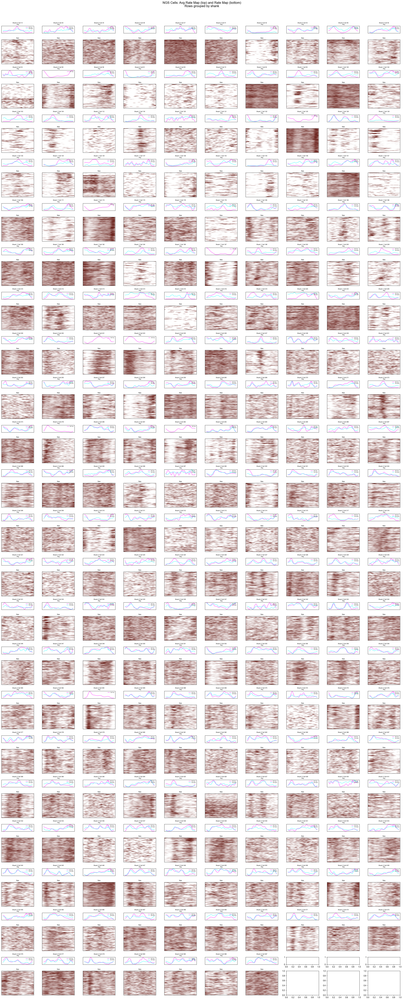

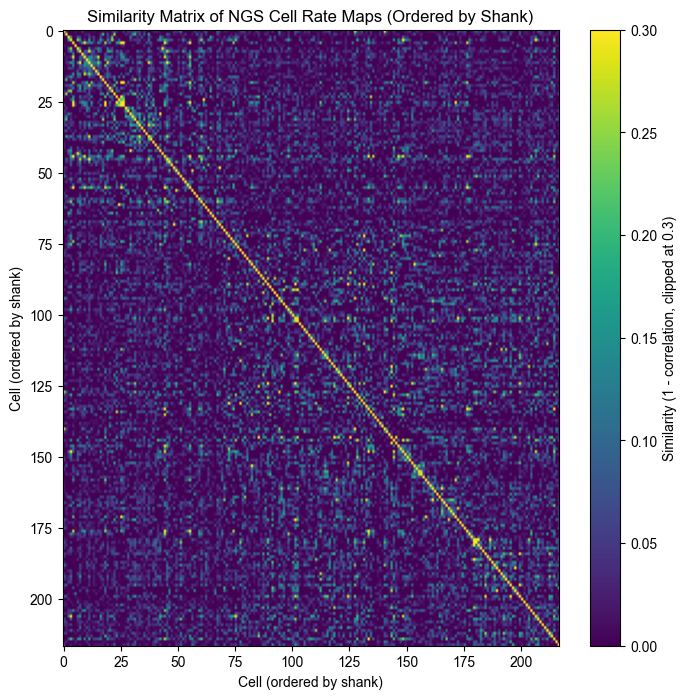

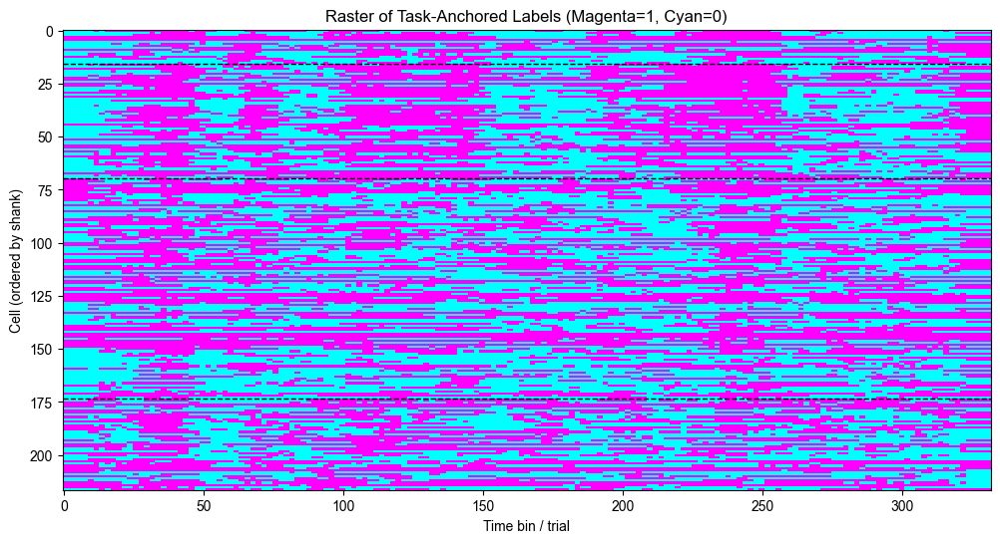

In [19]:
# For all NGS cells, plot avg rate map and rate map in a single figure using subplots,
# 10 cells per row, for each 2 successive rows: first is avg rate map, second is rate map.
# Height ratios: 0.3 for avg rate maps, 1 for rate maps.

# --- Plotting code ---

# Group NGS cells by shank
ngs = reconstruct_shank_id(ngs, mouse, colname='probe_x')
shank_ids = sorted(ngs['shank_id'].unique())
ngs_cells_by_shank = {shank: ngs[ngs['shank_id'] == shank].cluster_id.values for shank in shank_ids}

# Flatten all cells, keeping shank info
global_cell_list = []
global_shank_list = []
for shank in shank_ids:
    for cid in ngs_cells_by_shank[shank]:
        global_cell_list.append(cid)
        global_shank_list.append(shank)

n_cells = len(global_cell_list)
n_cols = 10  # 10 cells per row
n_rows = int(np.ceil(n_cells / n_cols))

fig, ax = plt.subplots(
    nrows=n_rows*2, ncols=n_cols,
    figsize=(2.8 * n_cols, 1.6 * n_rows * 2),
    gridspec_kw={'height_ratios': [0.3, 1] * n_rows}
)
fig.suptitle('NGS Cells: Avg Rate Map (top) and Rate Map (bottom)\nRows grouped by shank', fontsize=16)

avg_rate_maps = []
cell_shank_order = []
all_labels = []
cell_ids_ordered = []

for idx, (target_cluster_id, shank) in enumerate(zip(global_cell_list, global_shank_list)):
    row = (idx // n_cols) * 2
    col = idx % n_cols
    tcs_to_use = {cluster_id: tcs[cluster_id] for cluster_id in [target_cluster_id] if cluster_id in tcs}
    tcs_to_use[1000] = tcs_to_use[target_cluster_id]

    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3]
    fvalid = results[5]
    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels = np.isin(max_peaks, peak_indices).astype(int)
    tc = tcs[target_cluster_id]
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin]
    labels = get_kmeans_spatial_labels(tc, labels, bs=bs, tl=tl)

    # Store for similarity matrix
    avg_rate_maps.append(tc)
    cell_shank_order.append(shank)
    all_labels.append(labels)
    cell_ids_ordered.append(target_cluster_id)

    # Avg rate map (task-anchored)
    ax_avg = ax[row, col]
    for label, color in zip([True, False], ["magenta", "cyan"]):
        mask = (labels == label)
        if np.sum(mask) > 5:
            x, y = get_avg_profile(tc, bs, tl, mask=mask)
            ax_avg.plot(x, y, color=color, linewidth=1, label=f'TA={label}')
    ax_avg.set_title(f'Shank {shank} Cell {target_cluster_id}\nAvg', fontsize=7)
    ax_avg.legend(fontsize=5, loc='upper right', frameon=False)
    ax_avg.set_xticks([])
    ax_avg.set_yticks([])

    # Rate map (all trials)
    ax_rate = ax[row+1, col]
    plot_firing_rate_map(ax_rate, tc, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap('#69201a'))
    ax_rate.set_title(f'Rate', fontsize=7)
    ax_rate.set_xticks([])
    ax_rate.set_yticks([])

plt.tight_layout(rect=[0, 0, 1, 0.97])
plt.show()

# --- Similarity matrix ---

from scipy.spatial.distance import pdist, squareform

rate_map_matrix = np.vstack([zscore(tc) for tc in avg_rate_maps])
similarity = 1 - squareform(pdist(rate_map_matrix, metric='correlation'))

# Order by shank
order = np.argsort(cell_shank_order)
similarity_ordered = similarity[order][:, order]

# Clip similarity at 0.3
similarity_ordered = np.clip(similarity_ordered, 0, 0.3)

plt.figure(figsize=(8, 8))
plt.imshow(similarity_ordered, aspect='auto', cmap='viridis', vmin=0, vmax=0.3)
plt.colorbar(label='Similarity (1 - correlation, clipped at 0.3)')
plt.title('Similarity Matrix of NGS Cell Rate Maps (Ordered by Shank)')
plt.xlabel('Cell (ordered by shank)')
plt.ylabel('Cell (ordered by shank)')
plt.show()

# --- Raster plot of task_anchored_labels for all cells, ordered by shank ---

# Stack all labels (padded to same length)
max_len = max(len(lab) for lab in all_labels)
labels_matrix = np.full((len(all_labels), max_len), np.nan)
for i, lab in enumerate([all_labels[idx] for idx in order]):
    labels_matrix[i, :len(lab)] = lab

# Create color map: 1=magenta, 0=cyan, nan=white
from matplotlib.colors import ListedColormap, BoundaryNorm
cmap = ListedColormap(["cyan", "magenta", "white"])
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2], cmap.N)

plt.figure(figsize=(12, 6))
plt.imshow(labels_matrix, aspect='auto', cmap=cmap, norm=norm, interpolation='none')
plt.xlabel('Time bin / trial')
plt.ylabel('Cell (ordered by shank)')
plt.title('Raster of Task-Anchored Labels (Magenta=1, Cyan=0)')

# Draw horizontal lines to show shank boundaries
shank_counts = [np.sum(np.array(cell_shank_order)[order] == shank) for shank in shank_ids]
shank_ends = np.cumsum(shank_counts)
for y in shank_ends[:-1]:
    plt.axhline(y-0.5, color='black', linestyle='--', linewidth=1)
plt.show()

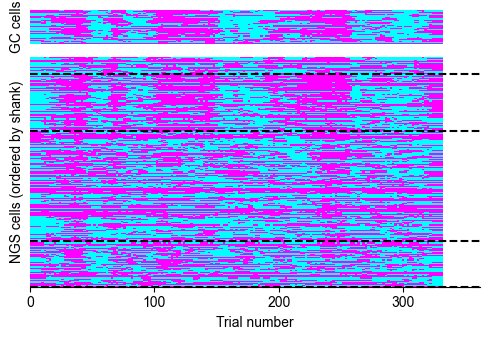

In [111]:
# --- Raster plot of task_anchored_labels for all cells, ordered by shank, with GCS raster above ---

# Compute GCS task-anchored label rasters (ordered as in gcs DataFrame)
gcs_labels = []
for cluster_id in gcs.cluster_id.values:
    tc = tcs[cluster_id] if cluster_id in tcs else None
    if tc is None:
        gcs_labels.append(np.array([]))
        continue
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin]
    tcs_to_use = {cluster_id: tc}
    tcs_to_use[1000] = tc
    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3]
    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels = np.isin(max_peaks, peak_indices).astype(int)
    labels = get_kmeans_spatial_labels(tc, labels, bs=bs, tl=tl)
    gcs_labels.append(labels)

# Pad both GCS and NGS label matrices to the same number of columns
max_len = max([len(lab) for lab in all_labels] + [len(lab) for lab in gcs_labels])
labels_matrix_ngs = np.full((len(all_labels), max_len), np.nan)
for i, lab in enumerate([all_labels[idx] for idx in order]):
    labels_matrix_ngs[i, :len(lab)] = lab
labels_matrix_gcs = np.full((len(gcs_labels), max_len), np.nan)
for i, lab in enumerate(gcs_labels):
    labels_matrix_gcs[i, :len(lab)] = lab

# Create color map: 1=magenta, 0=cyan, nan=white
from matplotlib.colors import ListedColormap, BoundaryNorm
cmap = ListedColormap(["cyan", "magenta", "white"])
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2], cmap.N)

fig, axes = plt.subplots(2, 1, figsize=(5, 3.5), sharex=True, gridspec_kw={'height_ratios': [len(gcs_labels), len(all_labels)]})

# GCS raster (top)
im0 = axes[0].imshow(labels_matrix_gcs, aspect='auto', cmap=cmap, norm=norm, interpolation='nearest', rasterized=False)
axes[0].set_ylabel('GC cells')
axes[0].set_yticks([])
for spine in axes[0].spines.values():
    spine.set_visible(False)
axes[0].tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)

# NGS raster (bottom)
im1 = axes[1].imshow(labels_matrix_ngs, aspect='auto', cmap=cmap, norm=norm, interpolation='nearest', rasterized=False)
axes[1].set_xlabel('Trial number')
axes[1].set_ylabel('NGS cells (ordered by shank)')
axes[1].set_yticks([])
for spine in axes[1].spines.values():
    spine.set_visible(False)
axes[1].tick_params(left=False, bottom=True, labelleft=False, labelbottom=True)

# Draw bold horizontal lines to show shank boundaries on NGS raster, extending lines past the right edge
xmax = labels_matrix_ngs.shape[1]
for y in shank_ends[:]:
    axes[1].hlines(y-0.5, xmin=-0.5, xmax=xmax+30, color='black', linewidth=1.5, linestyle='dashed', clip_on=False)

axes[1].set_xlim([-0.5, xmax+30])
axes[1].spines["bottom"].set_visible(True)
xticks = list(range(0, xmax+1, 100))
axes[1].set_xticks(xticks)
axes[1].set_xticklabels(xticks)
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_3_xgboost/M{mouse}D{day}_TA_raster.pdf', dpi=1000)
plt.show()

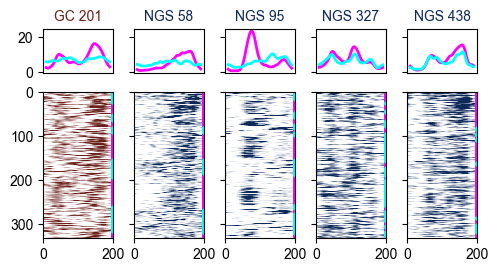

In [93]:
# Example: Avg rate map, rate map, and task-anchored raster for cell 201 and one NGS cell from each shank
# Cell 201 (color #69201a), NGS: 58 (shank 0), 95 (shank 1), 327 (shank 2), 438 (shank 3)

example_cells = [201, 58, 95, 327, 438]
example_labels = ["GC 201", "NGS 58", "NGS 95", "NGS 327", "NGS 438"]
example_colors = ["#69201a", "#0d2958", "#0d2958", "#0d2958", "#0d2958"]

from matplotlib.colors import ListedColormap, BoundaryNorm

cmap = ListedColormap(["cyan", "magenta", "white"])
norm = BoundaryNorm([-0.5, 0.5, 1.5, 2], cmap.N)

fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(rm_figsize[0]*5.6, rm_figsize[1]*1.7), gridspec_kw={'height_ratios': [0.3, 1]}, sharey='row')
for i, (cell_id, label, color) in enumerate(zip(example_cells, example_labels, example_colors)):
    tc = tcs[cell_id] if cell_id in tcs else None
    if tc is None:
        continue
    tc = gaussian_filter(np.nan_to_num(tc).astype(np.float64), sigma=2.5)
    tc = tc[:last_ephys_bin]
    # Spectral analysis and task-anchored labels
    tcs_to_use = {cell_id: tc}
    tcs_to_use[1000] = tc
    results = spectral_analysis(tcs_to_use, tl, bs=bs)
    spectrograms = results[3]
    S = spectrograms.mean(0)
    max_peaks = np.argmax(S, axis=0)
    labels_ta = np.isin(max_peaks, peak_indices).astype(int)
    labels_ta = get_kmeans_spatial_labels(tc, labels_ta, bs=bs, tl=tl)
    # Avg rate map (task-anchored)
    ax_avg = axes[0, i]
    ax_rate = axes[1, i]

    for label_val, plot_color in zip([True, False], ["magenta", "cyan"]):
        mask = (labels_ta == label_val)
        if np.sum(mask) > 5:
            x, y = get_avg_profile(tc, bs, tl, mask=mask)
            ax_avg.plot(x, y, color=plot_color, linewidth=2)
    ax_avg.set_title(label, fontsize=10, color=color)
    ax_avg.set_xticks([])
    # Rate map (all trials) with raster below
    plot_firing_rate_map(ax_rate, tc, bs=bs, tl=tl, p=95, sort_indices=None, cmap=white_to_hex_cmap(color) if cell_id==201 else white_to_hex_cmap('#0d2958'))
    # Overlay raster below the rate map, sharing x-axis
    raster = np.expand_dims(labels_ta, axis=0)
    extent = ax_rate.get_xlim() + (ax_rate.get_ylim()[0] - 0.15 * (ax_rate.get_ylim()[1] - ax_rate.get_ylim()[0]), ax_rate.get_ylim()[0])
    ax_rate.imshow(raster, aspect='auto', cmap=cmap, norm=norm, interpolation='none',
                   extent=[*ax_rate.get_xlim(), ax_rate.get_ylim()[0] - 0.15 * (ax_rate.get_ylim()[1] - ax_rate.get_ylim()[0]), ax_rate.get_ylim()[0]])

    for label_val, plot_color in zip([True, False], ["magenta", "cyan"]):
        mask = (labels_ta == label_val)
        ax_rate.scatter(200*np.ones(len(labels_ta))[mask], np.arange(len(labels_ta))[mask], color=plot_color, s=5, rasterized=True)

plt.subplots_adjust(wspace=0.3, hspace=0.2)
plt.savefig(f'/Users/harryclark/Documents/spatial-manifolds/scripts/figures/figure_3_xgboost/M{mouse}D{day}example_rate_maps_multishank.pdf')
plt.show()